In [1]:
import pandas as pd
import numpy as np
from urllib.request import urlopen
import json
import glob
import os

#Importing Data plotting libraries
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as py
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.ticker as ticker
import matplotlib.animation as animation

#Other Miscallaneous Libraries
import warnings
warnings.filterwarnings('ignore')
from IPython.display import HTML
import matplotlib.colors as mc
import colorsys
from random import randint
import re

In [2]:
#Reading the cumulative cases dataset
covid_cases = pd.read_csv('Novel Corona Virus 2019 Dataset/covid_19_data.csv')

#Viewing the dataset
covid_cases.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0


In [3]:
country_list = covid_cases['Country/Region'].unique()

country_grouped_covid = covid_cases[0:1]

for country in country_list:
    test_data = covid_cases['Country/Region'] == country   
    test_data = covid_cases[test_data]
    country_grouped_covid = pd.concat([country_grouped_covid, test_data], axis=0)
    
country_grouped_covid.reset_index(drop=True)
country_grouped_covid.head()

#Dropping of the column Last Update
country_grouped_covid.drop('Last Update', axis=1, inplace=True)

#Replacing NaN Values in Province/State with a string "Not Reported"
country_grouped_covid['Province/State'].replace(np.nan, "Not Reported", inplace=True)

#Printing the dataset
country_grouped_covid.head()

,SNo,ObservationDate,Province/State,Country/Region,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1.0,0.0,0.0
0,1,01/22/2020,Anhui,Mainland China,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1.0,0.0,0.0


In [33]:
#Creating the interactive map
py.init_notebook_mode(connected=True)

#GroupingBy the dataset for the map
formated_gdf = covid_cases.groupby(['ObservationDate', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf['Date'] = pd.to_datetime(formated_gdf['ObservationDate'])
formated_gdf['Date'] = formated_gdf['Date'].dt.strftime('%m/%d/%Y')

formated_gdf['ConfirmedCases'] = np.log(formated_gdf.Confirmed + 1)
formated_gdf['log_Fatalities'] = np.log(formated_gdf.Deaths + 1)

#Plotting the figure


fig = px.choropleth(formated_gdf, locations="Country/Region", locationmode='country names', 
                     color="ConfirmedCases", hover_name="Country/Region",projection="mercator",
                     animation_frame="Date",width=1000, height=800,
                     color_continuous_scale="Reds",
                     title='The Spread of COVID-19 Cases Across World')

#Showing the figure
fig.update(layout_coloraxis_showscale=True)
py.offline.iplot(fig)

In [36]:
#Creating the interactive map
py.init_notebook_mode(connected=True)

#GroupingBy the dataset for the map
formated_gdf = covid_cases.groupby(['ObservationDate', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf['Date'] = pd.to_datetime(formated_gdf['ObservationDate'])
formated_gdf['Date'] = formated_gdf['Date'].dt.strftime('%m/%d/%Y')

formated_gdf['log_ConfirmedCases'] = round(np.log(formated_gdf.Confirmed + 1))
formated_gdf['log_Deaths'] = round(np.log(formated_gdf.Deaths + 1))

#Plotting the figure


fig = px.choropleth(formated_gdf, locations="Country/Region", locationmode='country names', 
                     color="log_Deaths", hover_name="Country/Region",projection="mercator",
                     animation_frame="Date",width=1000, height=800,
                     color_continuous_scale='Reds',
                     title='The Deaths because of COVID-19 Cases')

#Showing the figure
fig.update(layout_coloraxis_showscale=True)
py.offline.iplot(fig)

In [32]:
 pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'd:\python3\python.exe -m pip install --upgrade pip' command.


In [28]:
formated_gdf.to_excel("output.xlsx")

In [38]:

folder_name = 'CoVCSD - Covid-19 Countries Statistical Dataset'
file_type = 'csv'
seperator =','
dataframe = pd.concat([pd.read_csv(f, sep=seperator) for f in glob.glob(folder_name + "/*."+file_type)],ignore_index=True,sort=False)
covid_data = dataframe[['Date', 'State', 'Country', 'Cumulative_cases', 'Cumulative_death',
       'Daily_cases', 'Daily_death', 'Latitude', 'Longitude', 'Temperature',
       'Min_temperature', 'Max_temperature', 'Wind_speed', 'Precipitation',
       'Fog_Presence', 'Population', 'Population Density/km', 'Median_Age',
       'Sex_Ratio', 'Age%_65+', 'Hospital Beds/1000', 'Available Beds/1000',
       'Confirmed Cases/1000', 'Lung Patients (F)', 'Lung Patients (M)',
       'Life Expectancy (M)', 'Life Expectancy (F)', 'Total_tests_conducted',
       'Out_Travels (mill.)', 'In_travels(mill.)', 'Domestic_Travels (mill.)']]

In [61]:
#Filtering of the dataset to view the latest contents (as of 30-03-2020)
latest_data = covid_data['Date'] == '30-03-2020'
country_data_detailed = covid_data[latest_data]

#Dropping off unecssary columns from the country_data_detailed dataset
country_data_detailed.drop(['Daily_cases','Daily_death','Latitude','Longitude'],axis=1,inplace=True)
#Replacing the text Not Reported and N/A with numpy missing value cmputation

country_data_detailed.replace('Not Reported',np.nan,inplace=True)
country_data_detailed.replace('N/A',np.nan,inplace=True)
#Converting the datatypes

country_data_detailed['Lung Patients (F)'].replace('Not reported',np.nan,inplace=True)
country_data_detailed['Lung Patients (F)'] = country_data_detailed['Lung Patients (F)'].astype("float")
#Getting the dataset to check the correlation 
corr_data = country_data_detailed.drop(['Date','State','Country','Min_temperature','Max_temperature','Out_Travels (mill.)',
                                        'In_travels(mill.)','Domestic_Travels (mill.)','Total_tests_conducted','Age%_65+',
                                        'Population','Population Density/km','Median_Age','Sex_Ratio','Hospital Beds/1000','Available Beds/1000','Lung Patients (F)',
                                       'Lung Patients (M)','Life Expectancy (M)','Life Expectancy (F)','Confirmed Cases/1000'], axis=1)

#Converting the dataset to the correlation function
corr = corr_data.corr()

In [62]:
corr.style.background_gradient(cmap="RdPu").set_precision(2)


,Cumulative_cases,Cumulative_death,Temperature,Wind_speed,Precipitation,Fog_Presence
Cumulative_cases,1.00,0.86,-0.18,-0.01,-0.03,0.01
Cumulative_death,0.86,1.00,-0.09,-0.02,-0.02,-0.03
Temperature,-0.18,-0.09,1.00,-0.01,0.01,-0.15
Wind_speed,-0.01,-0.02,-0.01,1.00,-0.02,0.00
Precipitation,-0.03,-0.02,0.01,-0.02,1.00,0.24
Fog_Presence,0.01,-0.03,-0.15,0.00,0.24,1.00


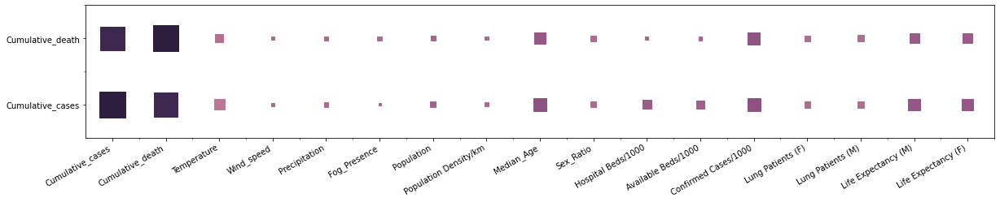

In [54]:
def heatmap(x, y, size,color):
    fig, ax = plt.subplots(figsize=(20,3))
    
    # Mapping from column names to integer coordinates
    x_labels = corr_data.columns
    y_labels = ['Cumulative_cases', 'Cumulative_death']
    x_to_num = {p[1]:p[0] for p in enumerate(x_labels)} 
    y_to_num = {p[1]:p[0] for p in enumerate(y_labels)} 
    
    n_colors = 256 # Use 256 colors for the diverging color palette
    palette = sns.cubehelix_palette(n_colors) # Create the palette
    color_min, color_max = [-1, 1] # Range of values that will be mapped to the palette, i.e. min and max possible correlation

    def value_to_color(val):
        val_position = float((val - color_min)) / (color_max - color_min) # position of value in the input range, relative to the length of the input range
        ind = int(val_position * (n_colors - 1)) # target index in the color palette
        return palette[ind]

    
    ax.scatter(
    x=x.map(x_to_num),
    y=y.map(y_to_num),
    s=size * 1000,
    c=color.apply(value_to_color), # Vector of square color values, mapped to color palette
    marker='s')
    # Show column labels on the axes
    ax.set_xticks([x_to_num[v] for v in x_labels])
    ax.set_xticklabels(x_labels, rotation=30, horizontalalignment='right')
    ax.set_yticks([y_to_num[v] for v in y_labels])
    ax.set_yticklabels(y_labels)
    
    
    ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
    ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)
    
    ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5]) 
    ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])
    
corr = pd.melt(corr.reset_index(), id_vars='index') 
corr.columns = ['x', 'y', 'value']
heatmap(x=corr['x'],y=corr['y'],size=corr['value'].abs(),color=corr['value'])

In [56]:
matrix = corr_data.corr()
matrix

,Cumulative_cases,Cumulative_death,Temperature,Wind_speed,Precipitation,Fog_Presence,Population,Population Density/km,Median_Age,Sex_Ratio,Hospital Beds/1000,Available Beds/1000,Confirmed Cases/1000,Lung Patients (F),Lung Patients (M),Life Expectancy (M),Life Expectancy (F)
Cumulative_cases,1.000000,0.864749,-0.176452,-0.012863,-0.030839,0.008276,0.049479,-0.028253,0.249196,-0.046893,0.121463,0.098001,0.247648,-0.057533,-0.070263,0.205991,0.188021
Cumulative_death,0.864749,1.000000,-0.094223,-0.017474,-0.020087,-0.028783,0.030890,-0.019015,0.183435,-0.048905,0.016645,0.024119,0.224138,-0.049741,-0.058107,0.144692,0.134639
Temperature,-0.176452,-0.094223,1.000000,-0.007298,0.006486,-0.145397,0.186334,-0.041675,-0.512779,0.216392,-0.430989,-0.320425,-0.404028,0.061522,-0.021162,-0.395169,-0.459310
Wind_speed,-0.012863,-0.017474,-0.007298,1.000000,-0.017242,0.002555,-0.006962,-0.020415,-0.052979,0.004048,0.017538,0.032394,0.113156,-0.051319,-0.059070,0.045239,0.029247
Precipitation,-0.030839,-0.020087,0.006486,-0.017242,1.000000,0.237261,0.001233,-0.046900,-0.108828,-0.077254,-0.043304,-0.020795,-0.075981,-0.028342,0.048196,-0.183765,-0.123188
Fog_Presence,0.008276,-0.028783,-0.145397,0.002555,0.237261,1.000000,-0.060561,-0.054641,-0.152938,0.128320,-0.065950,-0.004305,-0.019174,-0.089422,0.003768,-0.077101,-0.081630
Population,0.049479,0.030890,0.186334,-0.006962,0.001233,-0.060561,1.000000,-0.017447,-0.120398,0.044810,-0.175453,-0.176958,-0.075085,0.484367,0.388315,-0.117324,-0.149751
Population Density/km,-0.028253,-0.019015,-0.041675,-0.020415,-0.046900,-0.054641,-0.017447,1.000000,0.241869,-0.028244,0.385341,0.406308,0.134132,0.106040,0.023782,0.223675,0.244821
Median_Age,0.249196,0.183435,-0.512779,-0.052979,-0.108828,-0.152938,-0.120398,0.241869,1.000000,-0.121141,0.697603,0.614649,0.370051,-0.296080,-0.226850,0.827261,0.891561
Sex_Ratio,-0.046893,-0.048905,0.216392,0.004048,-0.077254,0.128320,0.044810,-0.028244,-0.121141,1.000000,-0.246676,-0.195123,0.001528,-0.034721,-0.101963,0.065140,-0.031876


In [65]:
#Reading the temperature data file
temperature_data = pd.read_csv('CoVCSD - Covid-19 Countries Statistical Dataset/aaaaaaatemperature_data.csv')
unique_temp = temperature_data['Temperature'].unique()
confirmed_cases = []
deaths = []

for temp in unique_temp:
    temp_wise = temperature_data['Temperature'] == temp
    test_data = temperature_data[temp_wise]
    
    confirmed_cases.append(test_data['Daily_cases'].sum())
    deaths.append(test_data['Daily_death'].sum())
    
#Converting the lists to a pandas dataframe.

temperature_dataset = {'Temperature' : unique_temp, 'Confirmed' : confirmed_cases, 'Deaths' : deaths}
temperature_dataset = pd.DataFrame(temperature_dataset)

In [73]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(go.Scattergl(x = temperature_dataset['Temperature'],y = temperature_dataset['Confirmed'], mode='markers',
                                  marker=dict(color='olive',line_width=1)),secondary_y=False)



fig.update_layout(title='Daily Confirmed Cases (COVID-19) vs. Temperature (Celcius) : Global Figures - January 22 - March 30 2020',
                  yaxis=dict(title='confirmed case'),xaxis=dict(title='temperature'))

fig.update_yaxes(title_text="BoxPlot Range ", secondary_y=True)

fig.show()

In [77]:
sample = temperature_dataset['Temperature'].sample(n=250)
test = temperature_dataset['Temperature']

from scipy.stats import ttest_ind

stat, p = ttest_ind(sample, test)
print('Statistics=%.3f, p=%.3f' % (stat, p))

Statistics=1.069, p=0.285
